# Интерактивная карта фрактального множества

### Условие задачи

**Дано:**

Варианты фрактальных множеств:

- [фрактал Ляпунова](https://ru.wikipedia.org/wiki/Фрактал_Ляпунова)
  1. AB
  2. BBBBBBAAAAAA
  3. AABAB
  4. ABBBCA

- [множество Жюлиа](https://ru.wikipedia.org/wiki/Множество_Жюлиа)
  5. $z_{n+1} = z^3_n + c$
  6. $z_{n+1} = z^4_n + c$
  7. $z_{n+1} = z^3_n + z^2_n + c$
  8. $z_{n+1} = z^4_n + z^3_n + c$

- [бассейны Ньютона](https://ru.wikipedia.org/wiki/Бассейны_Ньютона)
  9. $p(z) = z^3 - 1$
  10. $p(z) = z^8 + 15z^4 - 16$
  11. $p(z) = z^3 - 2z + 2$
  12. $p(z) = sin(z)$


Обозначим за $\lambda$:
 - количество итераций (множество Жюлиа),
 - количество итераций для достижения заданной погрешности достижения корня (бассейны Ньютона)
 - экспонента Ляпунова (фрактал Ляпунова)

**Требуется**

 - реализовать функции и откомпилировать их при помощи модуля `Numba`:
     - расчет $\lambda$ для точки на комплексной плоскости
     - расчет $\lambda$ на регулярной решетке на комплексной плоскости (эта функция должна быть распараллелена при помощи `prange`)

 - создать интерактивную карту при помощи класса `DynamicMap` модуля `holoviews`:
     - цветом отобразить значение $\lambda$
     - выбрать цветовую карту [colormap](https://matplotlib.org/stable/tutorials/colors/colormaps.html)
     - размеры карты - не менее 600 х 600 точек
     - отрегулировать количество итераций так, чтобы время вычисления одного обновления карты было менее 1 секунды

 - сохранить 5 различных изображений:
     - найти красивые места на карте, применив переносы и масштабирования
     - воспользоваться кнопкой сохранения на интерактивной карте

 - добавить описание:
     - к каждой константе (комментарий)
     - к каждой функции (`docstring`)

**Правила оценивания:**

- оценка за корректно реализованные функции и созданную интерактивную карту `100` баллов

- штрафы $p(i)$, баллов:
    - не работает интерактивная карта - 50
    - ошибки в реализации функций - 20
    - не выполнена компиляция и распараллеливание - 20
    - отсутствует 5 изображений - 20
    - отсутствует `docstring` - 20
    - менее значимые недоработки - 10
    - другие ошибки штрафуются индивидуально в зависимости от их тяжести

- итоговая оценка за задание = $100 - \sum_{i}{p(i)}$

In [1]:
# !pip3 install numpy matplotlib numba holoviews

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import numba as nb
import time
import glob
import matplotlib.image as mpimg

In [2]:
fractal = 'BBBBBBAAAAAA'
f = lambda x: 0 if x == 'A' else 1
arr = np.array([f(x) for x in fractal])

In [3]:
@nb.njit(fastmath = True)
def lyapunov_fractal(arr, a, b, max_iter = 100):
    """
    Computes Lyapunov's exponent in one point with (a,b) coordinates,
    based on string of A and B symbols. Uses iterative algorithm
    for Lyapunov's exponent: https://en.wikipedia.org/wiki/Lyapunov_fractal
    param:
        arr - 1-D array of 1/0 values, where 1 stands for B and 0 for A
        in fractal parameter string
        a - first coordinate of point
        b - second coordinate of point
        max_iter - number of iterations, affects the precision
    return:
        lambda - Lyapunov's exponent value in point (a,b)
    """
    x = 0.5 # начальное значение для x
    current_sum = 0 
    eps = 0.00001 # константа для численной стабильности в логарифме
    for i in range(max_iter):
        if arr[i % len(arr)] == 0:
            r = a
        else:
            r = b
        current_sum += np.log(np.abs(r * (1 - 2 * x)) + eps)
        x = r * x * (1 - x)
    return current_sum / max_iter

In [6]:
%%time
lyapunov_fractal(arr, 0.1, 0.1, 1000)

CPU times: user 40 µs, sys: 1 µs, total: 41 µs
Wall time: 45.1 µs


-2.3117522532226724

In [7]:
@nb.njit(parallel = True)
def lyapunov_fractal_grid(arr, a_vals, b_vals, max_iter = 100):
    """
    Computes Lyapunov's Fractal Map in grid of points with (a,b) coordinates,
    where points a and b are in arrays a_vals and b_vals respectively;
    fractal is based on string of A and B symbols. Uses iterative algorithm
    for Lyapunov's exponent: https://en.wikipedia.org/wiki/Lyapunov_fractal
    param:
        arr - 1-D array of 1/0 values, where 1 stands for B and 0 for A
        in fractal parameter string;
        a_vals - 1-D array (N,) of float coordinates, axis=0;
        b - 1-D (M,) array of float coordinates, axis=1;
        max_iter - number of iterations, affects the precision.
    return:
        result - 2-D (N, M) array, consists of Lyapunov's fractal map.
    """
    result = np.empty((len(a_vals), len(b_vals)))
    epsilon = 0.00001 # константа для численной стабильности в логарифме
    for i in nb.prange(len(a_vals)):
        a = a_vals[i]
        for j in range(len(b_vals)):
            b = b_vals[j]
            x = 0.5 # начальное значение для x
            current_sum = 0
            for k in range(max_iter):
                if arr[k % len(arr)] == 0:
                    r = a
                else:
                    r = b
                current_sum += np.log(np.abs(r * (1 - 2 * x)) + epsilon)
                x = r * x * (1 - x)
            result[i, j] = current_sum / max_iter
    return result

In [14]:
a_start, a_stop, b_start, b_stop = 0, 4, 0, 4

a = np.arange(a_start, a_stop, (a_stop - a_start) / 1200)
b = np.arange(b_start, b_stop, (b_stop - b_start) / 1200)

In [17]:
%%time
grid = lyapunov_fractal_grid(arr, a, b, 400)

CPU times: user 3.17 s, sys: 8.2 ms, total: 3.18 s
Wall time: 377 ms


In [18]:
A, B = np.meshgrid(a, b)

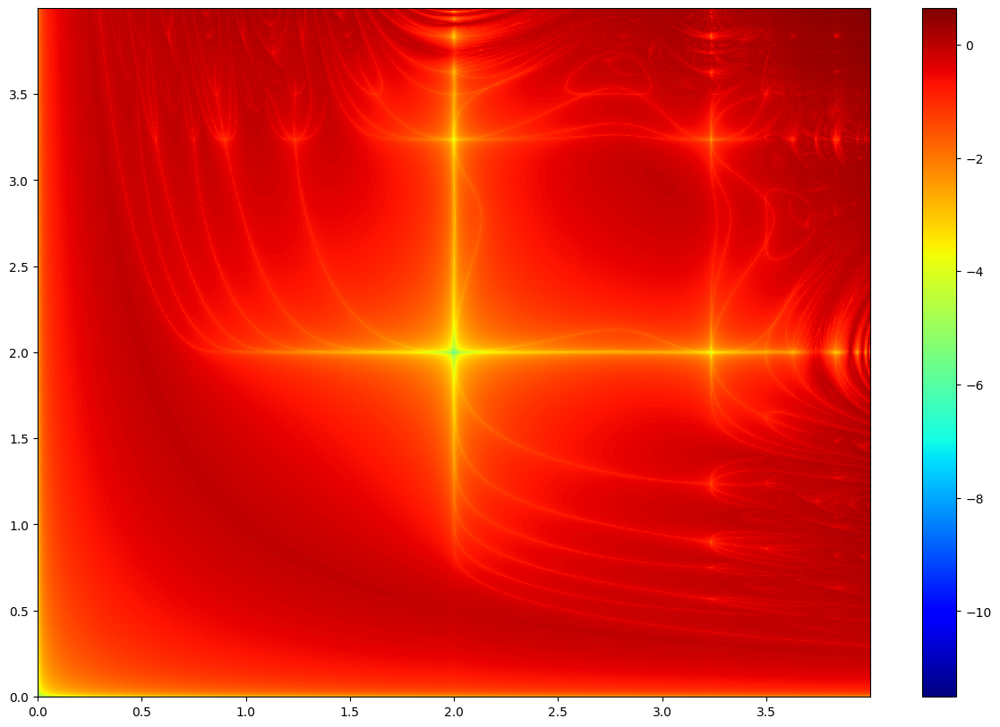

In [19]:
plt.figure(figsize=(15, 10))
plt.pcolormesh(A, B, grid, cmap = 'jet')
plt.colorbar()
plt.show()

In [20]:
%env HV_DOC_HTML=true

env: HV_DOC_HTML=true


In [21]:
import holoviews as hv
from holoviews import opts
from holoviews.streams import RangeXY

In [22]:
def get_fractal(x_range, y_range):
    """
    Calculates 600x600 fractal map for holoviews.DynamicMap in grid x_range by y_range.
    param:
        x_range - tuple of two float values, start and stop of 0 axis range;
        y_range - tuple of two float values, start and stop of 1 axis range.
    return:
        img - holoviews.Image of fractal map in parameter ranges.
    """
    imwidth, imheight = 600, 600 # Задаем размер изображения в карте
    max_iter = 400 # Задаем число итераций для быстрой работы карты
    a_start, a_stop = x_range
    b_start, b_stop = y_range
    a = np.arange(a_start, a_stop, (a_stop - a_start) / imwidth)
    b = np.arange(b_start, b_stop, (b_stop - b_start) / imheight)
    arra = lyapunov_fractal_grid(arr, a, b, max_iter)
    img = hv.Image(arra, bounds=(a_start, b_start, a_stop, b_stop))
    
    return img

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
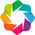

:DynamicMap   []
   :Image   [x,y]   (z)

In [23]:
hv.extension('bokeh')

a_start, a_stop, b_start, b_stop = 0, 4, 0, 4

range_stream = RangeXY(x_range=(a_start, a_stop),
                       y_range=(b_start, b_stop)
                       )
dmap = hv.DynamicMap(get_fractal, streams=[range_stream])


dmap.opts(opts.Image(cmap='jet',
                     logz=False, 
                     height=imheight,
                     width=imwidth,
                     colorbar=False
                     ))

In [41]:
!unzip fractals_images.zip

Archive:  fractals_images.zip
   creating: fractals_images/
  inflating: __MACOSX/._fractals_images  
  inflating: fractals_images/fractal_plot_1.png  
  inflating: __MACOSX/fractals_images/._fractal_plot_1.png  
  inflating: fractals_images/fractal_plot_2.png  
  inflating: __MACOSX/fractals_images/._fractal_plot_2.png  
  inflating: fractals_images/fractal_plot_3.png  
  inflating: __MACOSX/fractals_images/._fractal_plot_3.png  
  inflating: fractals_images/.DS_Store  
  inflating: __MACOSX/fractals_images/._.DS_Store  
  inflating: fractals_images/fractal_plot_4.png  
  inflating: __MACOSX/fractals_images/._fractal_plot_4.png  
  inflating: fractals_images/fractal_plot_5.png  
  inflating: __MACOSX/fractals_images/._fractal_plot_5.png  


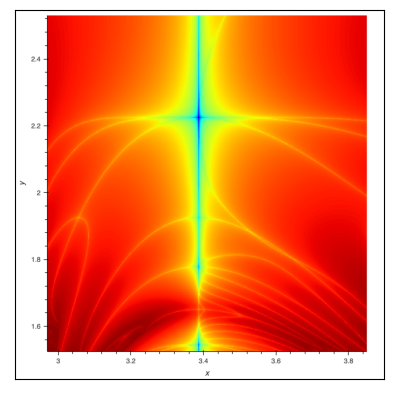

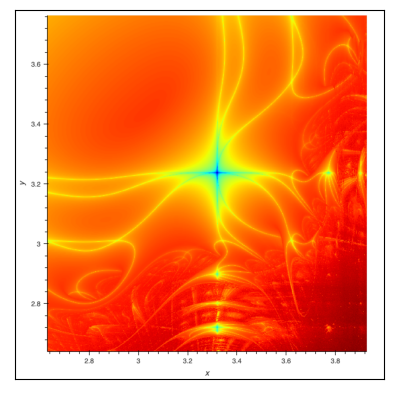

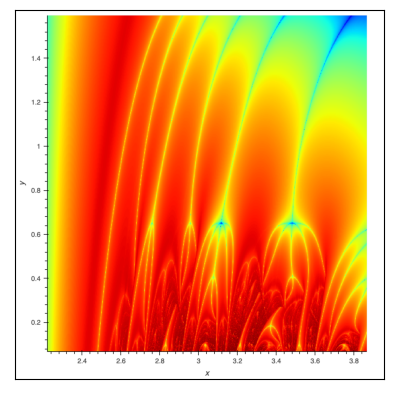

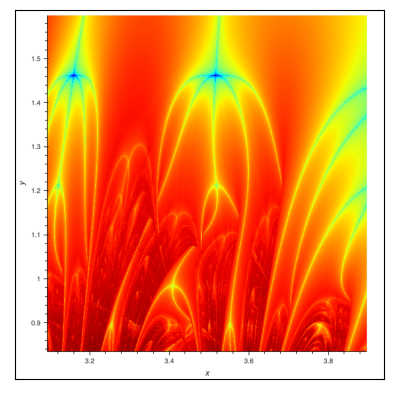

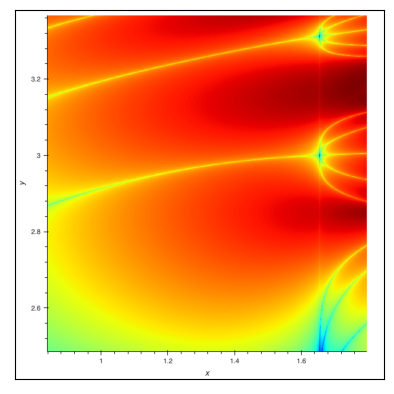

In [48]:
for i in glob.glob('fractals_images/*.png'):
    plt.imshow(mpimg.imread(i))
    plt.xticks([])
    plt.yticks([])
    plt.show()